<a href="https://colab.research.google.com/github/Qiustander/Simple_MCMC_tasks/blob/main/MCMC_For_VAR1_(diagonal_case).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Dependencies & Prerequisites

<div class="alert alert-success">
    Tensorflow Probability is part of the colab default runtime, <b>so you don't need to install Tensorflow or Tensorflow Probability if you're running this in the colab</b>.
    <br>
    If you're running this notebook in Jupyter on your own machine (and you have already installed Tensorflow), you can use the following
    <br>
      <ul>
    <li> For the most recent stable TFP release: <code>pip3 install -q --upgrade tensorflow-probability</code></li>
    <li> For the most recent stable GPU-connected version of TFP: <code>pip3 install -q --upgrade tensorflow-probability-gpu</code></li>
In summary, if you are running this in a Colab, Tensorflow and TFP are already installed
</div>

In [ ]:
#@title Imports and Global Variables  { display-mode: "form" }
"""Import necessary packages and set global variables
"""
!pip3 install statsmodels
!pip3 install arviz
from __future__ import absolute_import, division, print_function

import numpy as np
import os
import statsmodels.api as sm
import arviz as az

#@markdown This sets the styles of the plotting (default is styled like plots from [FiveThirtyeight.com](https://fivethirtyeight.com/))
matplotlib_style = 'fivethirtyeight' #@param ['fivethirtyeight', 'bmh', 'ggplot', 'seaborn', 'default', 'Solarize_Light2', 'classic', 'dark_background', 'seaborn-colorblind', 'seaborn-notebook']
import matplotlib as mpl
import matplotlib.pyplot as plt; plt.style.use(matplotlib_style)
import matplotlib.axes as axes;
from matplotlib.patches import Ellipse
from mpl_toolkits.mplot3d import Axes3D
import pandas_datareader.data as web
%matplotlib inline
import seaborn as sns; sns.set_context('notebook')
from IPython.core.pylabtools import figsize
#@markdown This sets the resolution of the plot outputs (`retina` is the highest resolution)
notebook_screen_res = 'retina' #@param ['retina', 'png', 'jpeg', 'svg', 'pdf']
%config InlineBackend.figure_format = notebook_screen_res

import tensorflow as tf

# Eager Execution
#@markdown Check the box below if you want to use [Eager Execution](https://www.tensorflow.org/guide/eager)
#@markdown Eager execution provides An intuitive interface, Easier debugging, and a control flow comparable to Numpy. You can read more about it on the [Google AI Blog](https://ai.googleblog.com/2017/10/eager-execution-imperative-define-by.html)
use_tf_eager = False #@param {type:"boolean"}

# Use try/except so we can easily re-execute the whole notebook.
if use_tf_eager:
    try:
        tf.enable_eager_execution()
    except:
        pass

import tensorflow_probability as tfp
tfd = tfp.distributions
tfb = tfp.bijectors


def session_options(enable_gpu_ram_resizing=True, enable_xla=True):
    """
    Allowing the notebook to make use of GPUs if they're available.

    XLA (Accelerated Linear Algebra) is a domain-specific compiler for linear
    algebra that optimizes TensorFlow computations.
    """
    config = tf.ConfigProto()
    config.log_device_placement = True
    if enable_gpu_ram_resizing:
        # `allow_growth=True` makes it possible to connect multiple colabs to your
        # GPU. Otherwise the colab malloc's all GPU ram.
        config.gpu_options.allow_growth = True
    if enable_xla:
        # Enable on XLA. https://www.tensorflow.org/performance/xla/.
        config.graph_options.optimizer_options.global_jit_level = (
            tf.OptimizerOptions.ON_1)
    return config

def credible_interval(posterior_dist, alpha=0.05):
    """
    Compute the credible interval for a set of samples.

    Parameters:
    - posterior_dist: array-like, the set of samples
    - alpha: float, desired significance level (e.g., 0.05 for 95% credible interval)

    Returns:
    - tuple containing the lower and upper bounds of the credible interval
    """
    sorted_samples = np.sort(posterior_dist)
    lower_bound = np.percentile(sorted_samples, 100 * alpha / 2)
    upper_bound = np.percentile(sorted_samples, 100 * (1 - alpha / 2))

    return (lower_bound, upper_bound)

from tensorflow_probability.python.mcmc import TransformedTransitionKernel
from tensorflow_probability.python.mcmc import RandomWalkMetropolis
from tensorflow_probability.python.mcmc import HamiltonianMonteCarlo
from tensorflow_probability.python.mcmc import sample_chain
import tensorflow_probability.python.internal.prefer_static as ps

# Get TensorFlow version.
print(f'TnesorFlow version: {tf.__version__}')
print(f'TnesorFlow Probability version: {tfp.__version__}')


TnesorFlow version: 2.12.0
TnesorFlow Probability version: 0.20.1


#### References:
[1] Bayesian Data Analysis 3rd

[2] [Several MCMC convergence tools](https://colab.research.google.com/github/bebi103b/bebi103b.github.io/blob/master/lessons/16/mcmc_diagnostics.ipynb#scrollTo=0chfn87t4plw)

[3] [TFP case study](https://www.tensorflow.org/probability/examples/TensorFlow_Probability_Case_Study_Covariance_Estimation)

TODO: use [ArviZ](https://www.tensorflow.org/probability/examples/Modeling_with_JointDistribution) for diagnosis

# MCMC For Fitting VAR(1)

Vector autoregressive (VAR) model: $\boldsymbol{x}_t \in \mathbb{R}^n = \boldsymbol{\phi}_0 + \boldsymbol{\Phi} \boldsymbol{x}_{t-1} + \boldsymbol{ϵ}_t$, where $\boldsymbol{\phi}_0 \in \mathbb{R}^n$ is the intercept of the VAR model. $\boldsymbol{\Phi} \in \mathbb{R}^{n\times n}$ denotes the coefficients. $ϵ_t$ is the white noise. In this problem, the $ϵ_t$ is assumed to be the normal distribution that $ϵ_t \sim \mathcal{N}(0, \Sigma)$, where $Σ \in \mathbb{S}^{n\times n}$ is a positive definite matrix. We assume the VAR(1) model is weak-sense stationary. That is, the roots of the characteristic equation associated with $\boldsymbol{\Phi} - \boldsymbol{I}_n = 0$ has modulus less than 1. That is, the determinant of $|\lambda\boldsymbol{\Phi} - \boldsymbol{I}_n |= 0$ has eigenvalues $|\lambda_i| < 1, i = 1, \dots, n$.

Problem: estimate the posterior distributions of unknowns $\Sigma, \boldsymbol{\phi}_0, \boldsymbol{\Phi}$ in the VAR(1) model.

We can derive the mean of the VAR(1) from the stationary condtion:
\begin{align}
&\mathbb{E}[\boldsymbol{x}_t] = \boldsymbol{\phi}_0 +  \boldsymbol{\Phi} \mathbb{E}[\boldsymbol{x}_{t-1}]\\
& ⇔ \mathbb{E}[\boldsymbol{x}_t] = \left(\boldsymbol{I}_n -\boldsymbol{\Phi} \right)^{-1} \boldsymbol{\phi}_0.
\end{align}
Similarly, the variance of the VAR(1) model is
\begin{align}
&Var(\boldsymbol{x}_t) =  \boldsymbol{\Phi}Var(\boldsymbol{x}_{t-1})\boldsymbol{\Phi}^T + \Sigma\\
& ⇔ vec(Var(\boldsymbol{x}_t)) = \left(\boldsymbol{I}_{n^2} - \left(\boldsymbol{\Phi} \otimes \boldsymbol{\Phi} \right)\right)^{-1} vec(\Sigma),
\end{align}
where $vec(\cdot)$ is the vectorization and $\otimes$ denotes the outer product.

#### Simple case

$\boldsymbol{\Phi}$ is a  diagonal matrix, $Σ \in \mathbb{S}^{n\times n}$ is positive definite.


#### Piror
First of all, define the data likelihood function $l(\boldsymbol{x}|\Sigma, \boldsymbol{\phi}_0, \boldsymbol{\Phi}) = \mathcal{N}(\boldsymbol{x}_1| \left(\boldsymbol{I}_n - \boldsymbol{\Phi} \right)^{-1} \boldsymbol{\phi}_0 , \text{reshape}\left\{\left(\boldsymbol{I}_{n^2} - \left(\boldsymbol{\Phi} \otimes \boldsymbol{\Phi} \right)\right)^{-1} vec(\Sigma)\right\})\prod_{t=2} \mathcal{N}(\boldsymbol{x}_t| \boldsymbol{\phi}_0 + \boldsymbol{\Phi} \boldsymbol{x}_{t-1}, \Sigma)$ where each point follows the normal distribution, as stated above. We assume that the first observation is obtained from the stationary distribution. In order to simplify the analysis, we assume that the data length is long enough such that the first data $x_1$ has little influence of the data likelihood. Therefore, $l(\boldsymbol{x}|\Sigma, \boldsymbol{\phi}_0, \boldsymbol{\Phi}) \approx \prod_{t=2} \mathcal{N}(\boldsymbol{x}_t| \boldsymbol{\phi}_0 + \boldsymbol{\Phi} \boldsymbol{x}_{t-1}, \Sigma)$.


For $\boldsymbol{\Phi}$, since it is a diagonal matrix, we define the prior distribution for the diagonal element as $\pi(\boldsymbol{\Phi}) \sim \mathcal{U}(-1, 1)$ which is the uniform distribution, for the  reason that $|\boldsymbol{\Phi}|< 1$.

For $\Sigma$, we define the prior distribution as a  Inverse-Wishart distribution $\pi(\Sigma) \sim \mathcal{IW}(\mathbf{\nu}_0, \Psi_0)$. However, TFP does not have Inverse-Wishart distribution. We can transfer the problem to estimate the precsion matrix $\pi(\Lambda) \sim \mathcal{W}(\mathbf{\nu}_0, V_0)$ which is the inverse matrix of the covariance matrix. The prior distribution is the Wishart distribution.

For the intercept $\boldsymbol{\phi}_0$, we define  the prior distribution as the normal distribution $\pi(\boldsymbol{\phi}_0) \sim \mathcal{N}(\boldsymbol{\mu}_{\boldsymbol{\phi}_0}, \Sigma_{\boldsymbol{\phi}_0})$.

Therefore, the joint posterior distribution $p(\Lambda, \boldsymbol{\phi}_0, \boldsymbol{\Phi}|\boldsymbol{x}) ∝ l(\boldsymbol{x}|\Lambda, \boldsymbol{\phi}_0, \boldsymbol{\Phi}) \pi(\Lambda) \pi(\boldsymbol{\Phi})\pi(\boldsymbol{\phi}_0)$. We need to be careful that $\Lambda$ is positive definite, and each element of $\boldsymbol{\Phi}$ must be inside $(-1, 1)$.

#### Data Setting

Data:
*   Signal dimension: 10
*   Simulated data points: 200 (generate 200*12 starting from stationary distribution, and only use last 200 points)
    *   $\boldsymbol{\Phi}$  is diagonal matrix with uniform distributed diagonal elements ranging from -0.9 to 0.9
    *   covariance matrix is $I + aa^T$, where $a$ is uniform distributed vector
    *   intercept $\varphi_0$ is sampled from a normal distritbuion $\mathcal{N}(0, 1)$

Sampling:
*   MCMC samples: 10000 (random walk M-H needs longer chains for convergence)
*   Burn-in period: 5000 (half of post-burnin samples)
*   Chains: 8 independent chains (usually larger than 4)





In [ ]:
# @title Data Generation  { run: "auto" }

signal_dim = 10

# Set seed
seed = int(np.random.randint(low=0, high=1000))
tf.random.set_seed(seed=seed)
# Number of samples.
n = 200

# True parameters

def_coefficient = tf.random.uniform(shape=[signal_dim], minval=-0.9, maxval=0.9)
# true_varphi = def_coefficient
true_varphi = tf.linalg.diag(def_coefficient)
print(f"VAR coefficient: {ps._get_static_value(def_coefficient)}")

true_ar_mean = tf.random.normal(shape=[signal_dim], mean=0.0, stddev=1.0)
print(f"VAR intercept: {ps._get_static_value(true_ar_mean)}")

# generate random lower trianglar matrix (cholesky part) with postive diagonal elements
# use numpy to generate the std matrix
A = 0.2 * np.random.rand(signal_dim, signal_dim)
noise_cov = tf.convert_to_tensor(np.eye(signal_dim)*0.5 + A.dot(A), dtype=true_ar_mean.dtype)
true_noise_std = tf.linalg.cholesky(noise_cov)
print(f"VAR noise std: {ps._get_static_value(true_noise_std)}")
true_precision = tf.linalg.inv(true_noise_std)

# Generate samples, starting from stationary distribution

# stationary mean
true_stationary_mean = tf.linalg.matvec(tf.linalg.inv(tf.eye(signal_dim) - true_varphi), true_ar_mean)
operator_coeff = tf.linalg.LinearOperatorFullMatrix(true_varphi)
true_cov = tf.linalg.matvec(tf.linalg.inv(tf.eye(signal_dim ** 2) -
                                          tf.linalg.LinearOperatorKronecker(
                                              [operator_coeff, operator_coeff]).to_dense()),
                            tf.reshape(noise_cov, [-1]))
true_staionary_std = tf.linalg.cholesky(tf.reshape(true_cov, [signal_dim, signal_dim]))

@tf.function
def gen_data():
    observations = tf.TensorArray(dtype=true_ar_mean.dtype, size=0, dynamic_size=True)
    old_obs = tfd.MultivariateNormalTriL(loc=true_stationary_mean,
                                         scale_tril=true_staionary_std).sample(seed=seed)
    observations = observations.write(0, old_obs)
    for i in tf.range(12 * n):
        new_obs = true_ar_mean + tf.linalg.matvec(true_varphi, old_obs) +\
                                          tfd.MultivariateNormalTriL(loc=tf.constant([0.] * signal_dim),
                                                                     scale_tril=true_noise_std).sample(seed=seed)
        observations = observations.write(i + 1, new_obs)
        old_obs = new_obs
    return observations.stack()
observations = gen_data()[-n:]

sample_mean = tf.reduce_mean(observations, axis=0)
sample_std = tf.linalg.cholesky(tfp.stats.covariance(observations, sample_axis=0))

print(f'sample mean: {sample_mean}')
print(f'sample std: {sample_std}')
print(f'true stationary mean: {true_stationary_mean}')
print(f'true stationary std: {true_staionary_std}')

PRIOR_MEAN_DELTA = tf.constant([0.] * signal_dim)
# PRIOR_STD_DELTA = tf.linalg.diag(tf.random.uniform(shape=[signal_dim], minval=0.2, maxval=4.0))
PRIOR_STD_DELTA = tf.linalg.diag(tf.constant([3.0] * signal_dim))
PRIOR_DF = signal_dim+2
PRIOR_SCALE = tf.linalg.diag(tf.random.uniform([signal_dim]) + 0.2) / PRIOR_DF

VAR coefficient: [ 0.62736356  0.54994965 -0.60802287 -0.84966564  0.21371472 -0.2755676
 -0.79667294  0.19077098 -0.63249254 -0.6616913 ]
VAR intercept: [ 1.9552628   0.90176356 -1.8002399   0.15563582  0.9239764  -0.5366142
  0.2606988  -0.27188724 -0.360718   -0.31666312]
VAR noise std: [[0.78257674 0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.11768393 0.778453   0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.13494825 0.16338506 0.7362244  0.         0.         0.
  0.         0.         0.         0.        ]
 [0.10633914 0.1077262  0.05397419 0.7399704  0.         0.
  0.         0.         0.         0.        ]
 [0.12223874 0.14071998 0.06836791 0.06700781 0.7579175  0.
  0.         0.         0.         0.        ]
 [0.10166918 0.10815555 0.05156207 0.05540704 0.06656988 0.7654018
  0.         0.         0.         0.        ]
 [0.13167337 0.16059652 0.06458629 0.07492694 0.1245188  0.1

#### Analytical Posterior Distribution

The posterior distribution of $\Lambda$ is
$\mathcal{W}\left( n - 1 +\nu_0, \left( \mathbf{V}_0^{-1} + \sum_{i=2}^n\left(\boldsymbol{x}_{\mathbf{i}} - \left(\boldsymbol{\Phi} \boldsymbol{x}_{t-1} + \boldsymbol{\phi}_0 \right)\right)\left(\boldsymbol{x}_{\mathbf{i}}-\left(\boldsymbol{\Phi} \boldsymbol{x}_{t-1} + \boldsymbol{\phi}_0 \right)\right)^T\right)^{-1} \right)$

The posterior distribution of $\boldsymbol{\Phi}$ is
$\mathcal{TN}\left( \left(\sum_{t=2}^n \boldsymbol{x}_{t-1}\boldsymbol{x}_{t-1}^T\right)^{-1} \sum_{t=2}^n \boldsymbol{x}_{t-1}(\boldsymbol{x}_t - \boldsymbol{\phi}_0)^T , \boldsymbol{\Sigma}\left(\sum_{t=2}^n \boldsymbol{x}_{t-1}\boldsymbol{x}_{t-1}^T\right)^{-1}\right)$, which is a truncated Normal defined in $(-1, 1)$.

The posterior distribution of $\boldsymbol{\phi}_0$ is
$\mathcal{N}\left(\left(\boldsymbol{\Sigma}_0^{-1} + (n-1) \boldsymbol{\Sigma}^{-1}\right)^{-1}\left(\boldsymbol{\Sigma}_0^{-1} \boldsymbol{\mu}_0 +  \boldsymbol{\Sigma}^{-1} \sum_{i=1}^n \left(\boldsymbol{x}_t - \boldsymbol{\Phi}\boldsymbol{x}_{t-1}\right) \right), \left(\boldsymbol{\Sigma}_0^{-1} + (n-1) \boldsymbol{\Sigma}^{-1}\right)^{-1}\right)$



In [ ]:
last_obs = tf.einsum('ij, bj -> bi', true_varphi, observations[:-1])
sample_cov = tf.matmul(sample_std, sample_std, transpose_b=True)
prior_cov = tf.matmul(PRIOR_STD_DELTA, PRIOR_STD_DELTA, transpose_b=True)
coeff_delta = tf.linalg.inv(prior_cov) + tf.linalg.inv(sample_cov) * (observations.shape[0] - 1)
sum_xt = tf.matmul( observations[:-1], observations[1:] - true_ar_mean, transpose_a=True)
sum_xt2 = tf.matmul(observations[:-1], observations[:-1], transpose_a=True)
coeff = tf.reduce_sum(observations[1:] - last_obs, axis=0)

true_posterior_mean_delta = tf.linalg.matvec(tf.linalg.inv(coeff_delta), tf.linalg.matvec(tf.linalg.inv(sample_cov), coeff) +
                                                                   tf.linalg.matvec(tf.linalg.inv(prior_cov),
                                                                             PRIOR_MEAN_DELTA))
print(f"posterior delta: {ps._get_static_value(true_posterior_mean_delta)}")

true_posterior_mean_varphi = tf.linalg.diag_part(tf.matmul(tf.linalg.inv(sum_xt2), sum_xt))
print(f"posterior varphi: {ps._get_static_value(true_posterior_mean_varphi)}")

temp = observations[1:] - (last_obs + true_ar_mean)
posterior_a = int(PRIOR_DF + ps.shape(observations)[0] - 1)
posterior_b = tf.linalg.inv(tf.linalg.inv(PRIOR_SCALE) + tf.matmul(temp, temp, transpose_a=True))

poster_dist = tfd.WishartTriL(
    df=posterior_a,
    scale_tril=tf.linalg.cholesky(posterior_b))
precision = poster_dist.mean()
true_posterior_noise_mean = tf.linalg.inv(tf.linalg.cholesky(precision))
true_posterior_noise_std = poster_dist.stddev()
print(f"posterior noise std: {ps._get_static_value(true_posterior_noise_mean)}")

posterior delta: [ 1.9642725   0.9314215  -1.7608287   0.11621015  0.9465704  -0.584875
  0.27189142 -0.27378324 -0.33513993 -0.384733  ]
posterior varphi: [ 0.6128866   0.5224165  -0.7627423  -0.76044697  0.30731454 -0.23030297
 -0.7516953   0.19005066 -0.7483966  -0.74852824]
posterior noise std: [[ 7.38228619e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-8.59932974e-03  8.25462222e-01  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 8.61523375e-02  9.67832059e-02  7.34073460e-01  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 1.51159734e-01  5.69619127e-02  8.23593736e-02  7.41093576e-01
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 5.10971285e-02  1.14359915e-0

In [ ]:
num_mcmc_samples = 10000
num_burn_in_steps = int(num_mcmc_samples//2)
# The number of chains is determined by the shape of the initial values.
# Here we'll generate N_CHAINS chains, so we'll need a tensor of N_CHAINS initial values.
N_CHAINS = 10

# Replicate the observations for each chain
replicate_observations = tf.tile(tf.expand_dims(observations, axis=1), multiples=[1, N_CHAINS, 1])

#### Parameter Setting

*   M-H algorithm: random walk normal distribution with std=0.02 with accpetance rate 0.18
*   HMC algorithm: adaptive size tunning, the step size is tunned during the burn-in period, then it is fixed. The leapfrog step is 3, and initial step size is 0.01.

Tunning Criteria:

* The optimal accpetance rate of the M-H algorithm is 0.234 in theory, try pilot experments with different standard deviation and find the best choice
* The adaptive HMC is targetted at the acceptance rate 0.651 which is the optimal acceptance rate.



In [ ]:
#@title Sampling
"""
define prior distribution
"""
# joint parameters - sigma, delta, varphi, prcesion matrix, VAR mean, VAR coefficient

def prior_dist(sigma, delta, varphi):
  return tfd.JointDistributionNamed(dict(
                delta=tfd.MultivariateNormalTriL(loc=PRIOR_MEAN_DELTA,
                                  scale_tril=PRIOR_STD_DELTA),
                sigma=tfd.WishartTriL(
                              df=PRIOR_DF,
                              scale_tril=tf.linalg.cholesky(PRIOR_SCALE)),
               varphi=tfd.Uniform(low=-0.99, high=0.99))).log_prob({'sigma': sigma,
                                                             'delta': delta,
                                                                    'varphi': tf.zeros([N_CHAINS,])})

operator_eye_mtx_big = tf.linalg.LinearOperatorDiag(tf.ones([N_CHAINS, signal_dim**2])+1e-6)
operator_eye_mtx = tf.linalg.LinearOperatorDiag(tf.ones([N_CHAINS, signal_dim])+1e-6)

"""
define target distribution
"""
def posterior_dist(observations):
    def _compute_posterior(sigma, delta, varphi):
        precisions_cholesky = tf.linalg.cholesky(sigma)
        covariances = tf.linalg.cholesky_solve(
            precisions_cholesky, tf.linalg.eye(signal_dim, batch_shape=[N_CHAINS]))
        noise_std = tf.linalg.cholesky(covariances)
        operator_varphi = tf.linalg.LinearOperatorDiag(varphi)
        varphi_diag = operator_varphi.to_dense()
        kron_operator = tf.linalg.LinearOperatorKronecker([operator_varphi, operator_varphi])
        subtract_kron_operator = tf.linalg.LinearOperatorFullMatrix(operator_eye_mtx_big.to_dense() -
                                                               kron_operator.to_dense())

        first_mean = tf.einsum('bcd, bd -> bc',
                               tf.linalg.inv(operator_eye_mtx.to_dense() - varphi_diag), delta)
        #use linear operator
        first_std = tf.einsum('bcd, bd -> bc', tf.linalg.LinearOperatorInversion(subtract_kron_operator).to_dense(),
                      tf.reshape(noise_std, [N_CHAINS, -1]))
        first_std = tf.reshape(first_std, [N_CHAINS, signal_dim, signal_dim])
        first_likelihood = tfd.MultivariateNormalTriL(loc=first_mean,
                                                        scale_tril=first_std).log_prob(observations[0, ...])
        #x_t = delta + phi x_t-1 + e_t
        data_mean = tf.einsum('cij, bcj -> bci', varphi_diag, observations[:-1, ...]) + delta
        data_std = noise_std
        rest_likelihood = tfd.MultivariateNormalTriL(loc=data_mean,
                                                        scale_tril=data_std).log_prob(observations[1:, ...])
        return first_likelihood + tf.reduce_sum(rest_likelihood, axis=0) + prior_dist(sigma, delta, varphi_diag)
    return _compute_posterior

"""
Sampling
"""

init_state = [true_posterior_noise_mean + 0.5*tf.linalg.diag(tf.random.uniform([N_CHAINS, signal_dim])),
                        true_posterior_mean_delta + tf.random.normal([N_CHAINS, signal_dim]),
                        0.8*true_posterior_mean_varphi + 0.1*tf.random.uniform([N_CHAINS, signal_dim])]

# init_state = [tf.linalg.diag(tf.random.uniform([N_CHAINS, signal_dim])+0.2),
#                         tf.random.normal([N_CHAINS, signal_dim]),
#                         tf.random.uniform([N_CHAINS, signal_dim])-0.4]

transformed_bijector = tfb.Chain([
    # step 3: take the product of Cholesky factors
    tfb.CholeskyOuterProduct(),
    # step 2: exponentiate the diagonals
    tfb.TransformDiagonal(tfb.Exp()),
    # step 1: map a vector to a lower triangular matrix
    tfb.FillTriangular(),
])

unconstrained_to_precision = tfb.JointMap(
    bijectors=[transformed_bijector, tfb.Identity(), tfb.Tanh()]
)


@tf.function
def run_metropolis_hasting():
  mh_kernel = RandomWalkMetropolis(posterior_dist(replicate_observations),
                                    new_state_fn=tfp.mcmc.random_walk_normal_fn(scale=0.02))

  states, kernels_results = sample_chain(num_results=num_mcmc_samples,
                                        current_state=init_state, #constant start
                                        num_burnin_steps=num_burn_in_steps,
                                        num_steps_between_results=20,
                                        kernel=TransformedTransitionKernel(mh_kernel,
                                                                                    bijector=unconstrained_to_precision),
                                        seed=seed)
  return states, kernels_results

@tf.function
def run_hmc():
  hmc_kernel = TransformedTransitionKernel(HamiltonianMonteCarlo(posterior_dist(replicate_observations),
                                    step_size=0.01,
                                    num_leapfrog_steps=3), bijector=unconstrained_to_precision)
  adapted_kernel = tfp.mcmc.SimpleStepSizeAdaptation(
    inner_kernel=hmc_kernel,
    num_adaptation_steps=int(num_burn_in_steps),
    target_accept_prob=0.651)

  states, kernels_results = sample_chain(num_results=num_mcmc_samples,
                                        current_state=init_state, #constant start
                                        num_burnin_steps=num_burn_in_steps,
                                        kernel=adapted_kernel,
                                        seed=seed)

  return states, kernels_results

mh_states, mh_results = run_metropolis_hasting()
hmc_states, hmc_results = run_hmc()



/usr/local/lib/python3.10/dist-packages/tensorflow_probability/python/mcmc/sample.py:339: UserWarning: Tracing all kernel results by default is deprecated. Set the `trace_fn` argument to None (the future default value) or an explicit callback that traces the values you are interested in.
  warnings.warn('Tracing all kernel results by default is deprecated. Set '
/usr/local/lib/python3.10/dist-packages/tensorflow_probability/python/mcmc/sample.py:339: UserWarning: Tracing all kernel results by default is deprecated. Set the `trace_fn` argument to None (the future default value) or an explicit callback that traces the values you are interested in.
  warnings.warn('Tracing all kernel results by default is deprecated. Set '


In [ ]:
#@title Diagonics
def run_diag():
  r_hat_mh = tfp.mcmc.potential_scale_reduction(
      mh_states,
      independent_chain_ndims=1,
      split_chains=True)
  r_hat_hmc = tfp.mcmc.potential_scale_reduction(
      hmc_states,
      independent_chain_ndims=1,
      split_chains=True)

  print(f"R^hat for MH algorithm {r_hat_mh}")
  print(f"R^hat for HMC algorithm {r_hat_hmc}")

  accept_rate_mh = tf.math.count_nonzero(mh_results.inner_results.is_accepted, axis=0)/num_mcmc_samples
  accept_rate_hmc = tf.math.count_nonzero(hmc_results.inner_results.inner_results.is_accepted, axis=0)/num_mcmc_samples

  print(f"Acceptance rate for MH algorithm {accept_rate_mh}")
  print(f"Acceptance rate for HMC algorithm {accept_rate_hmc}")

  ess_mh = tfp.mcmc.effective_sample_size(
      mh_states,
      cross_chain_dims=[1]*len(mh_states),
  )
  ess_hmc = tfp.mcmc.effective_sample_size(
      hmc_states,
      cross_chain_dims=[1]*len(hmc_states),
  )

  print(f"Effective sample size for MH algorithm {ess_mh}")
  print(f"Effective sample size for HMC algorithm {ess_hmc}")

run_diag()

R^hat for MH algorithm [<tf.Tensor: shape=(10, 10), dtype=float32, numpy=
array([[1.0026371, 1.0021331, 1.0033743, 1.0140758, 1.0065799, 1.0058432,
        1.0036864, 1.0046481, 1.0058854, 1.006224 ],
       [1.0021331, 1.001495 , 1.0069717, 1.0035098, 1.003447 , 1.0060079,
        1.0039421, 1.0039331, 1.0056616, 1.0028343],
       [1.0033743, 1.0069717, 1.0023094, 1.0086507, 1.0035677, 1.0072494,
        1.0051539, 1.0072997, 1.0059253, 1.0010815],
       [1.0140758, 1.0035098, 1.0086507, 1.0019062, 1.0040314, 1.0049127,
        1.0017725, 1.0044895, 1.0041558, 1.0056665],
       [1.0065799, 1.003447 , 1.0035677, 1.0040314, 1.0035478, 1.0092939,
        1.0032532, 1.0039642, 1.0050553, 1.003105 ],
       [1.0058432, 1.0060079, 1.0072494, 1.0049127, 1.0092939, 1.001897 ,
        1.0063   , 1.00264  , 1.0057979, 1.0042984],
       [1.0036864, 1.0039421, 1.0051539, 1.0017725, 1.0032532, 1.0063   ,
        1.0016345, 1.0028795, 1.005005 , 1.0055429],
       [1.0046481, 1.0039331, 1.00729

Effective sample size for MH algorithm [<tf.Tensor: shape=(10, 10), dtype=float32, numpy=
array([[ 9118.107 ,  4043.104 ,  2975.9058,  2277.2747,  3158.9639,
         3072.1423,  2879.0474,  3643.297 ,  2585.5527,  3605.048 ],
       [ 4043.104 , 10235.565 ,  2902.6382,  3354.0437,  3508.1074,
         3577.1406,  2767.4294,  3312.7266,  3031.8557,  3413.8647],
       [ 2975.9058,  2902.6382,  8975.009 ,  2721.0667,  3574.3767,
         3430.501 ,  2905.5046,  3766.584 ,  3198.1328,  3410.667 ],
       [ 2277.2747,  3354.0437,  2721.0667,  8464.681 ,  2947.3594,
         3171.8623,  3377.0955,  3855.263 ,  3124.069 ,  3376.8096],
       [ 3158.9639,  3508.1074,  3574.3767,  2947.3594,  8377.038 ,
         3487.6978,  3151.3848,  4070.1174,  2652.9749,  3780.4453],
       [ 3072.1423,  3577.1406,  3430.501 ,  3171.8623,  3487.6978,
         9455.921 ,  3095.4858,  4373.586 ,  2982.3245,  3611.8064],
       [ 2879.0474,  2767.4294,  2905.5046,  3377.0955,  3151.3848,
         3095.4858, 

#### Diagonics values

Apply the split-chain $\hat{R}$, if $\hat{R} < 1.1$ then it is convergent, a better practice is $\hat{R} < 1.01$.

Effective sample sizes: independent samples of each parameter, each value is the sum of all chains. It is a good practice for each parameter to have $ESS > 400$.

In [ ]:
mh_states_precison = mh_states[0]
covariances = tf.linalg.inv(mh_states_precison)
mh_states_sigma = tf.linalg.cholesky(covariances)
mh_states[0] = mh_states_sigma
hmc_states_precison = hmc_states[0]
covariances = tf.linalg.inv(hmc_states_precison)
hmc_states_sigma = tf.linalg.cholesky(covariances)
hmc_states[0] = hmc_states_sigma

In [ ]:
# @title Sample Mean

print("MH algorithm")
print(f"mean of sample sigma {tf.reduce_mean(mh_states[0], axis=[0, 1])}")
print(f"mean of sample delta {tf.reduce_mean(mh_states[1], axis=[0, 1])}")
print(f"mean of sample varphi {tf.reduce_mean(mh_states[2], axis=[0, 1])}")

print("HMC algorithm")
print(f"mean of sample sigma {tf.reduce_mean(hmc_states[0], axis=[0, 1])}")
print(f"mean of sample delta {tf.reduce_mean(hmc_states[1], axis=[0, 1])}")
print(f"mean of sample varphi {tf.reduce_mean(hmc_states[2], axis=[0, 1])}")


MH algorithm
mean of sample sigma [[ 8.19797635e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 9.44255069e-02  8.98524880e-01  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 1.63779393e-01  1.26127660e-01  7.34724343e-01  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 1.99704990e-01  9.18887556e-02  7.61692971e-02  7.45519221e-01
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 9.68647674e-02  1.50026143e-01  4.89672460e-02  9.49748456e-02
   7.98419893e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 1.39405727e-01  1.07345313e-01  5.74072637e-02  3.98770645e-02
   6.88143671e-02  7.89105952e-01  0.00000000e+00  0.00000000e+00

In [ ]:
true_varphi = tf.linalg.diag_part(true_varphi)
true_value = [true_noise_std, true_ar_mean, true_varphi]
posterior_value = [true_posterior_noise_mean, true_posterior_mean_delta, true_posterior_mean_varphi]

def plot_convergence(chain=1, state=0, element=0):
    poster_val = tf.reshape(posterior_value[state], [-1])
    true_val = tf.reshape(true_value[state], [-1])

    mh_dist = mh_states[state]
    hmc_dist = hmc_states[state]
    mh_dist_flatten = tf.reshape(mh_dist, [num_mcmc_samples, N_CHAINS, -1])
    hmc_dist_flatten = tf.reshape(hmc_dist, [num_mcmc_samples, N_CHAINS, -1])

    sm.graphics.tsa.plot_acf(mh_dist_flatten[:, chain, element],
                            title='Autocorrelation of MH algorithm',
                            lags=60)
    sm.graphics.tsa.plot_acf(hmc_dist_flatten[:, chain, element],
                            title='Autocorrelation of HMC algorithm',
                            lags=60)

    # plot the fist chain


    # Scatter plot of data samples and histogram
    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(111)
    sns.distplot(mh_dist_flatten[:, chain, element], ax=ax, label='Histogram of MH algorithm')
    # lines = ax.hist(mh_dist, bins=100, edgecolor="k", label="Histogram of MH algorithm")
    ci_mh = credible_interval(mh_dist_flatten[:, chain, element])
    ax.axvline(x=ci_mh[0], color='blue', linestyle='--', label='2.5% CI')
    ax.axvline(x=ci_mh[1], color='blue', linestyle='--', label='97.5% CI')
    ax.axvline(x=true_val[element], color='red', linestyle='-', label='true mean')
    ax.axvline(x=poster_val[element], color='black', linestyle='-', label='true posterior mean')
    ax.axvline(x=np.mean(mh_dist_flatten[:, chain, element]), color='red', linestyle='--', label='estimated posterior mean')

    ax.legend(loc="best")
    ax.grid(True, zorder=-5)
    plt.show()


    # Scatter plot of data samples and histogram
    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(111)
    sns.distplot(hmc_dist_flatten[:, chain, element], ax=ax, label='Histogram of HMC algorithm')
    ci_mh = credible_interval(hmc_dist_flatten[:, chain, element])
    ax.axvline(x=ci_mh[0], color='blue', linestyle='--', label='2.5% CI')
    ax.axvline(x=ci_mh[1], color='blue', linestyle='--', label='97.5% CI')
    ax.axvline(x=true_val[element], color='red', linestyle='-', label='true mean')
    ax.axvline(x=poster_val[element], color='black', linestyle='-', label='true posterior mean')
    ax.axvline(x=np.mean(hmc_dist_flatten[:, chain, element]), color='red', linestyle='--', label='estimated posterior mean')

    ax.legend(loc="best")
    ax.grid(True, zorder=-5)
    plt.show()

<ipython-input-39-554e89ca8c2e>:27: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(mh_dist_flatten[:, chain, element], ax=ax, label='Histogram of MH algorithm')


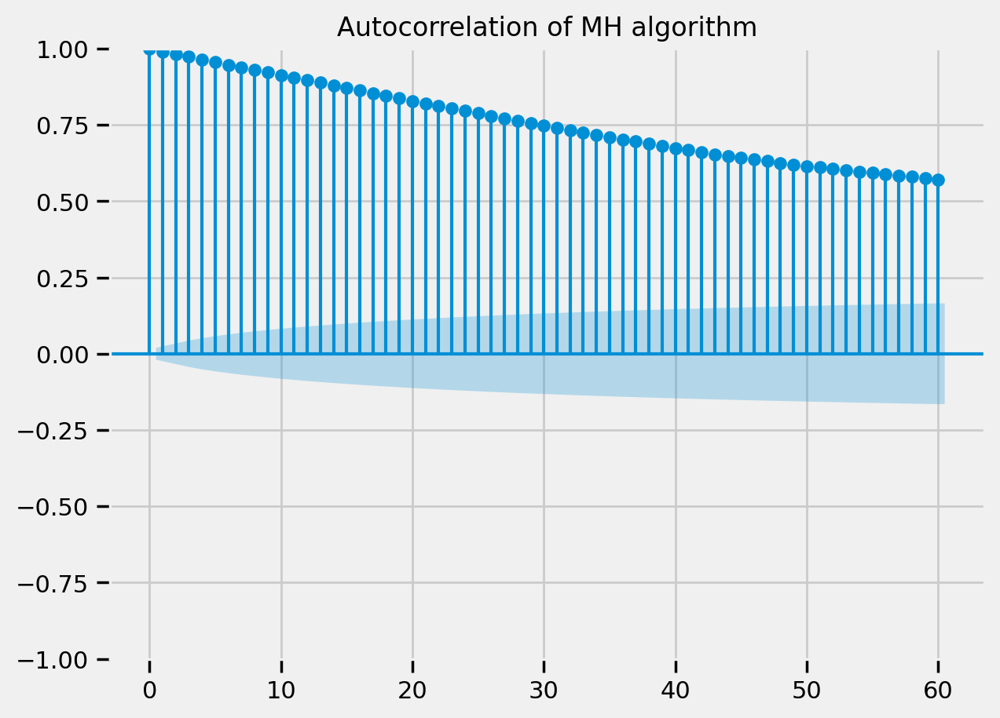

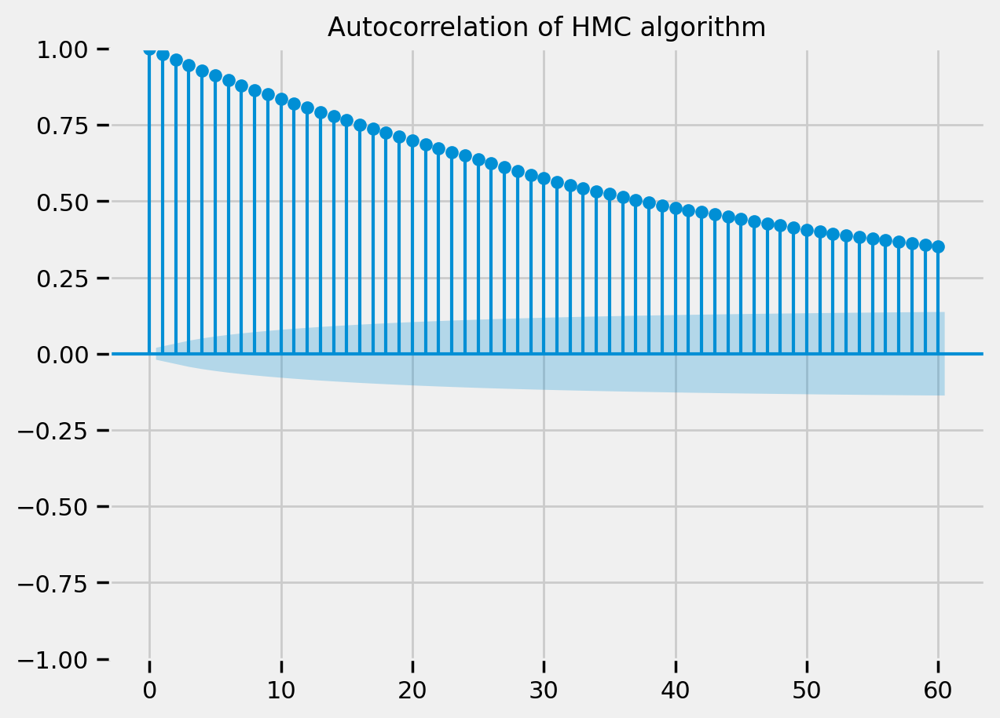

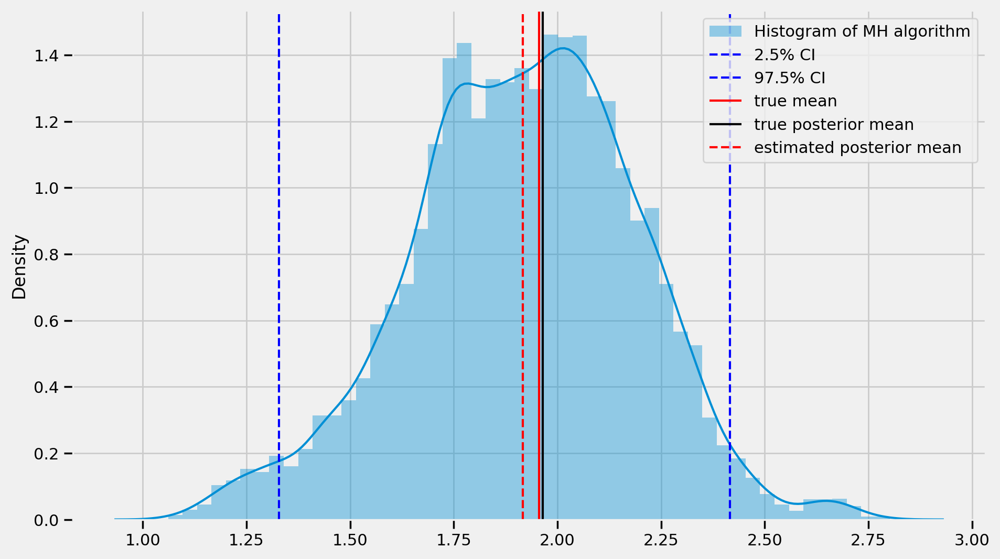

<ipython-input-39-554e89ca8c2e>:44: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(hmc_dist_flatten[:, chain, element], ax=ax, label='Histogram of HMC algorithm')


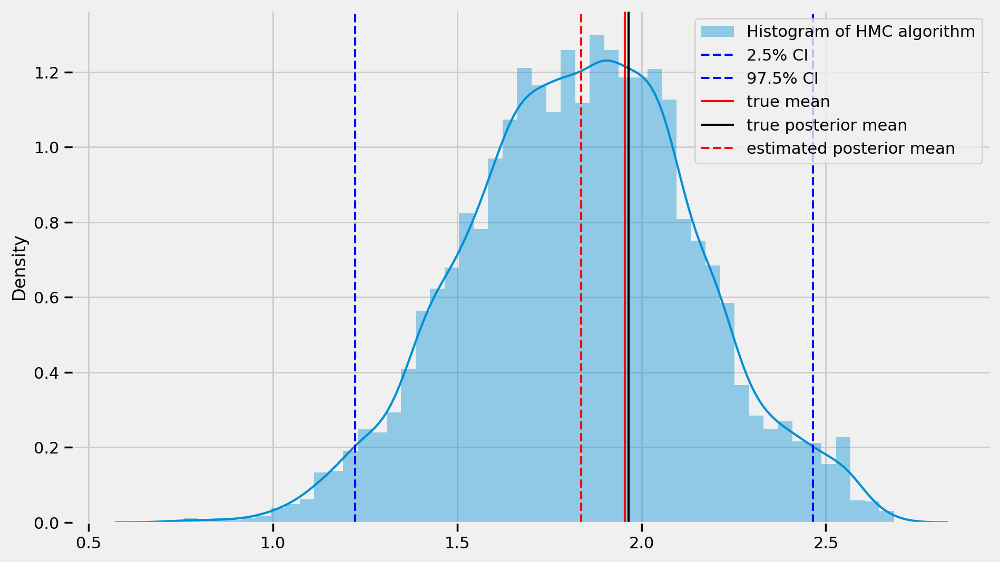

In [ ]:
plot_convergence(state=1, element=0)

In [ ]:
#@title Mixing Plot

def plot_mixing(state=0):
    mh_dist = mh_states[state]
    hmc_dist = hmc_states[state]
    mh_dist_flatten = tf.reshape(mh_dist, [num_mcmc_samples, N_CHAINS, -1])
    hmc_dist_flatten = tf.reshape(hmc_dist, [num_mcmc_samples, N_CHAINS, -1])
    current_val = tf.reshape(posterior_value[state], [-1])

    for i in range(mh_dist_flatten.shape[-1]):

        fig = plt.figure(figsize=(10, 6))
        ax = fig.add_subplot(111)

        plt.plot(mh_dist_flatten[:, :, i])

        ax.axhline(y=current_val[i], color='red', linestyle='-', label='true posterior')
        fig.suptitle(f'MH Mixing Plot of {N_CHAINS} chains for {i+1}-th dimension', fontsize=20)
        plt.show()

    for i in range(hmc_dist_flatten.shape[-1]):

        fig = plt.figure(figsize=(10, 6))
        ax = fig.add_subplot(111)

        plt.plot(hmc_dist_flatten[:, :, i])
        ax.axhline(y=current_val[i], color='red', linestyle='-', label='true posterior')
        fig.suptitle(f'HMC Mixing Plot of {N_CHAINS} chains for {i+1}-th dimension', fontsize=20)
        plt.show()

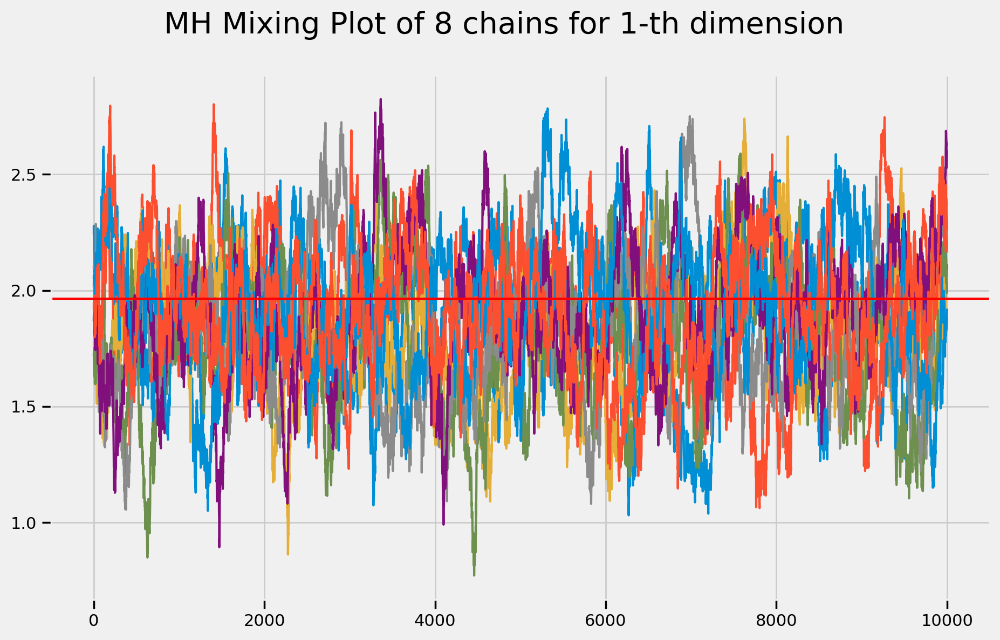

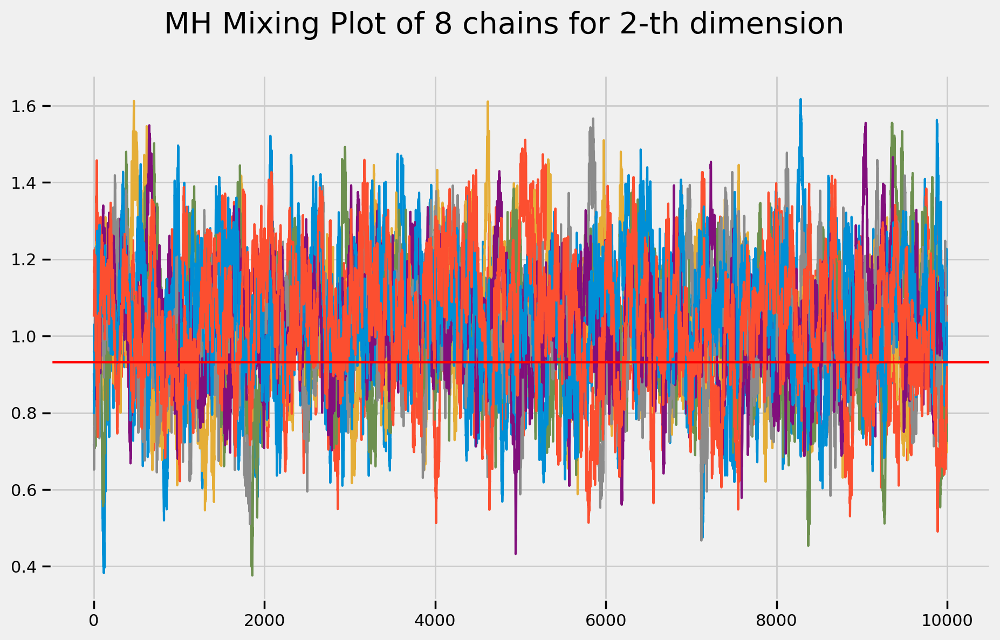

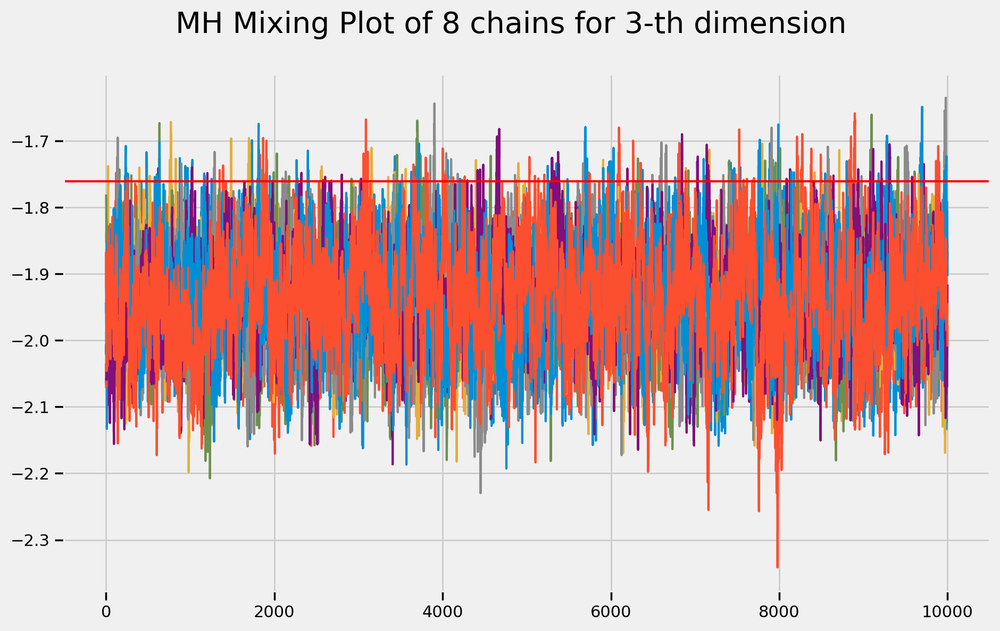

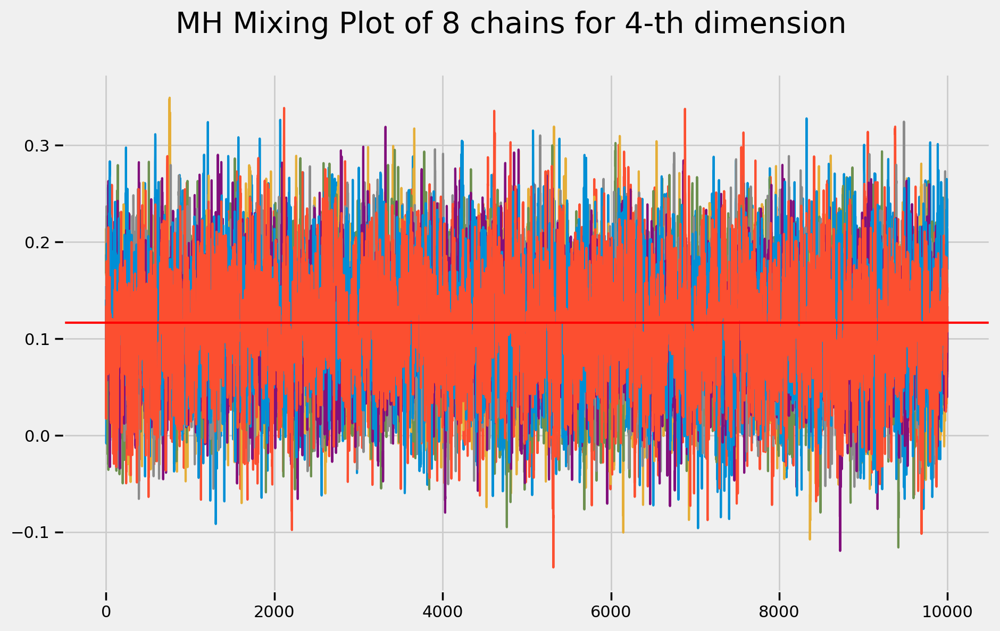

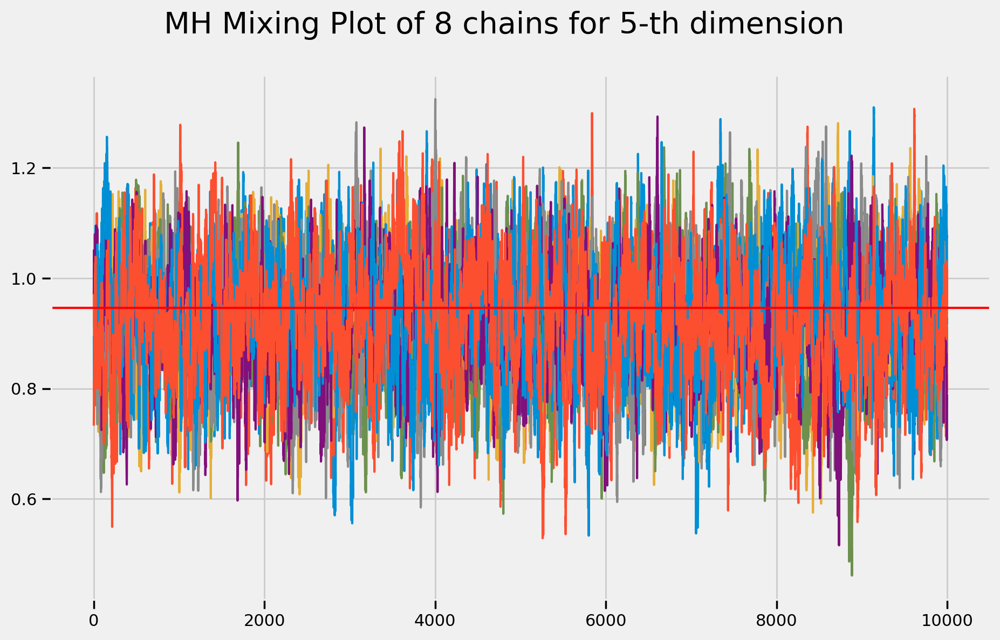

...

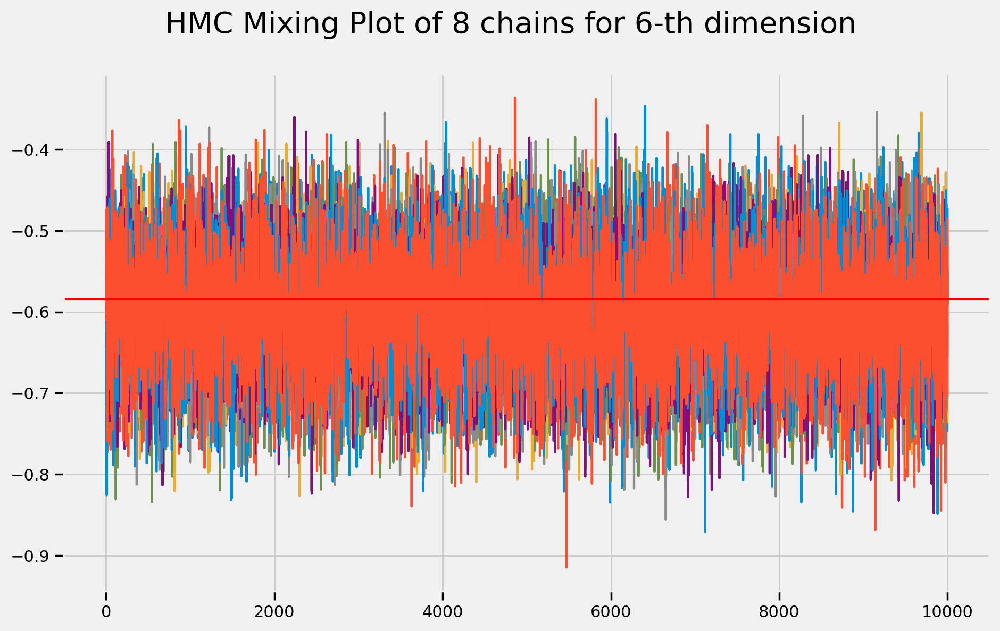

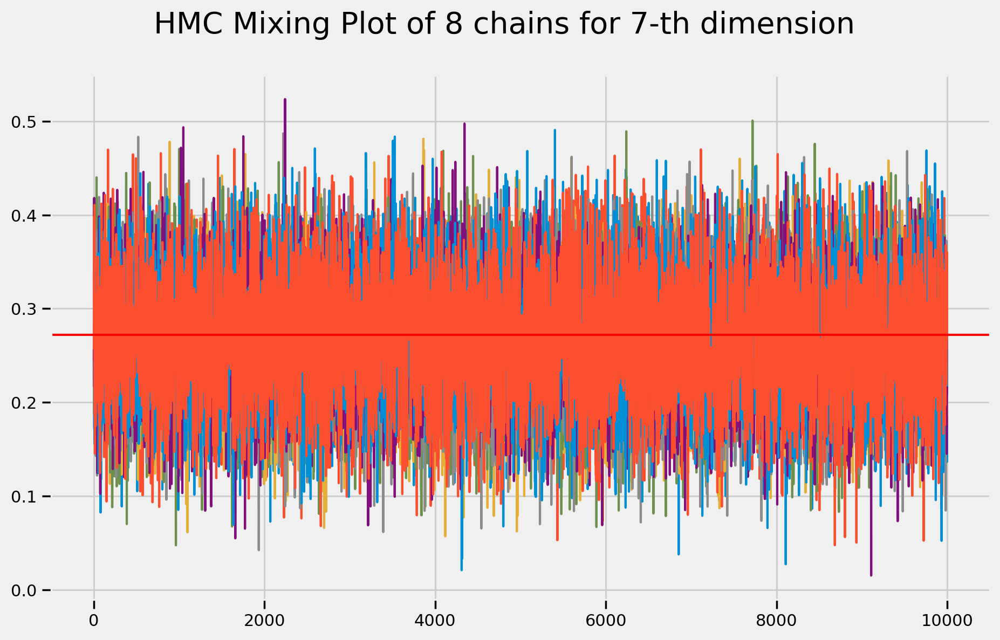

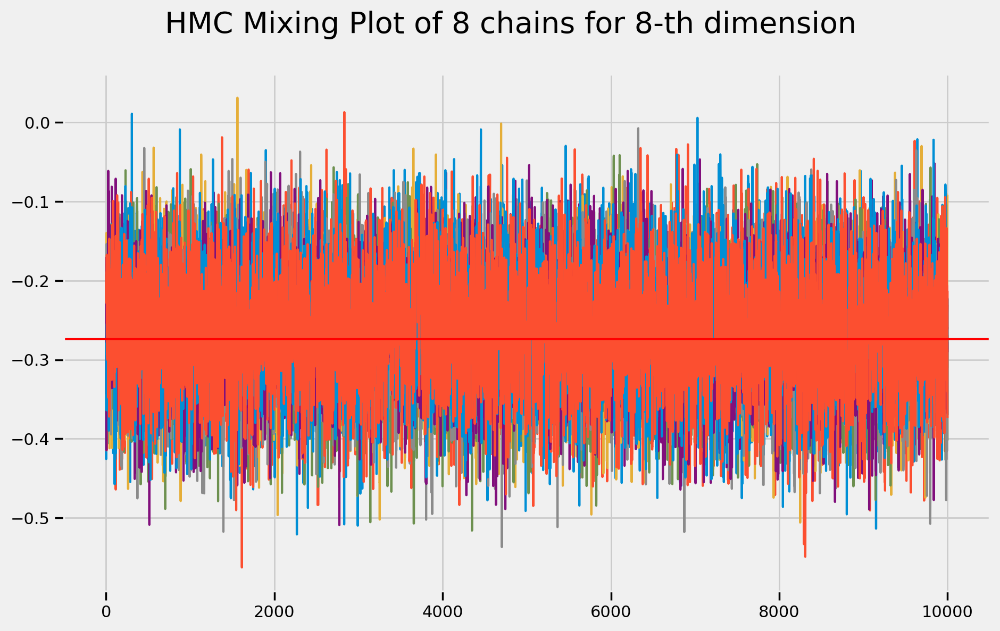

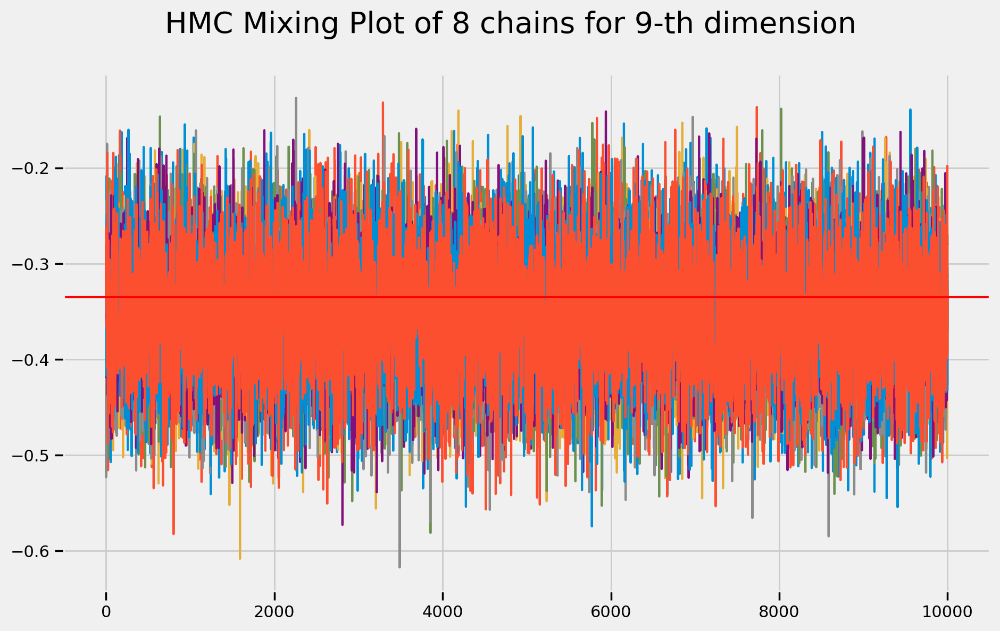

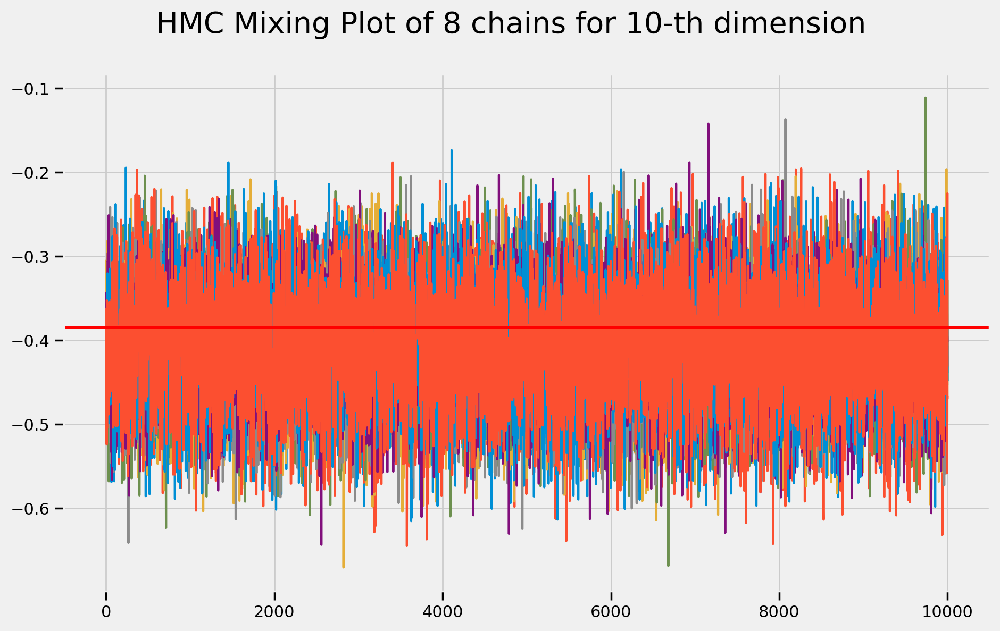

In [ ]:
plot_mixing(state=1)

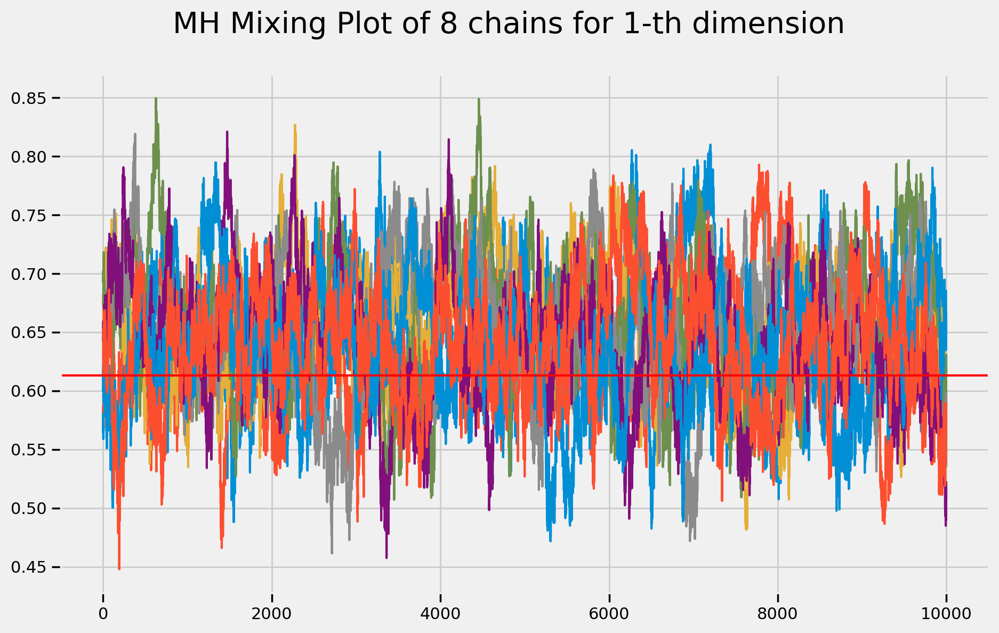

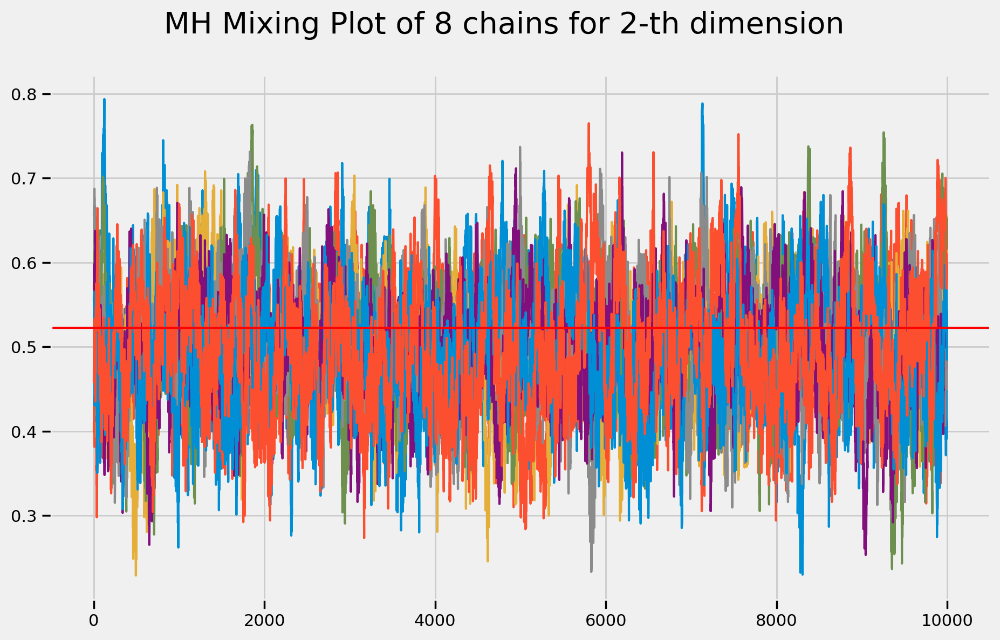

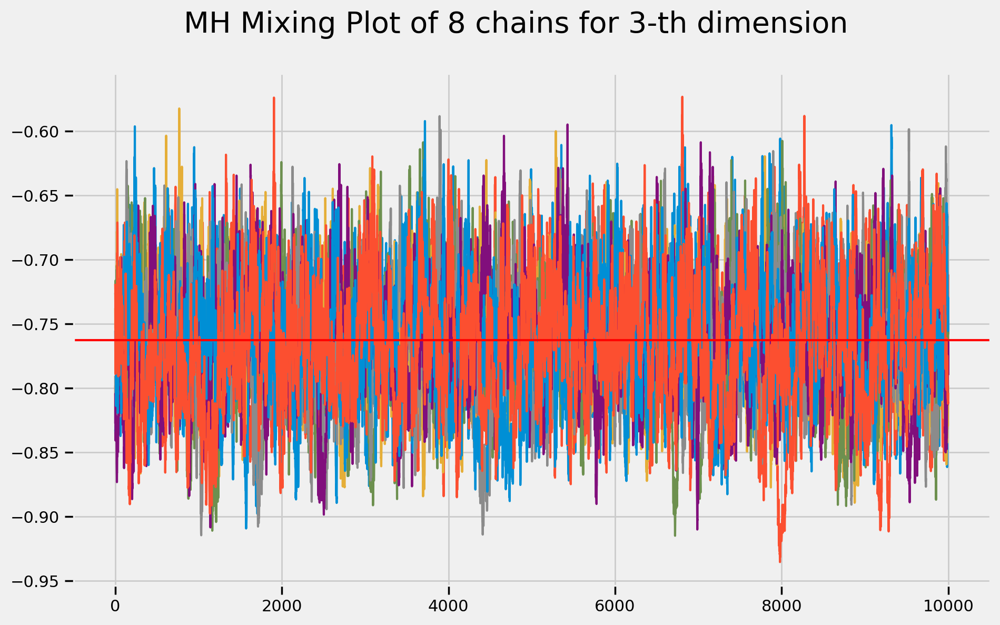

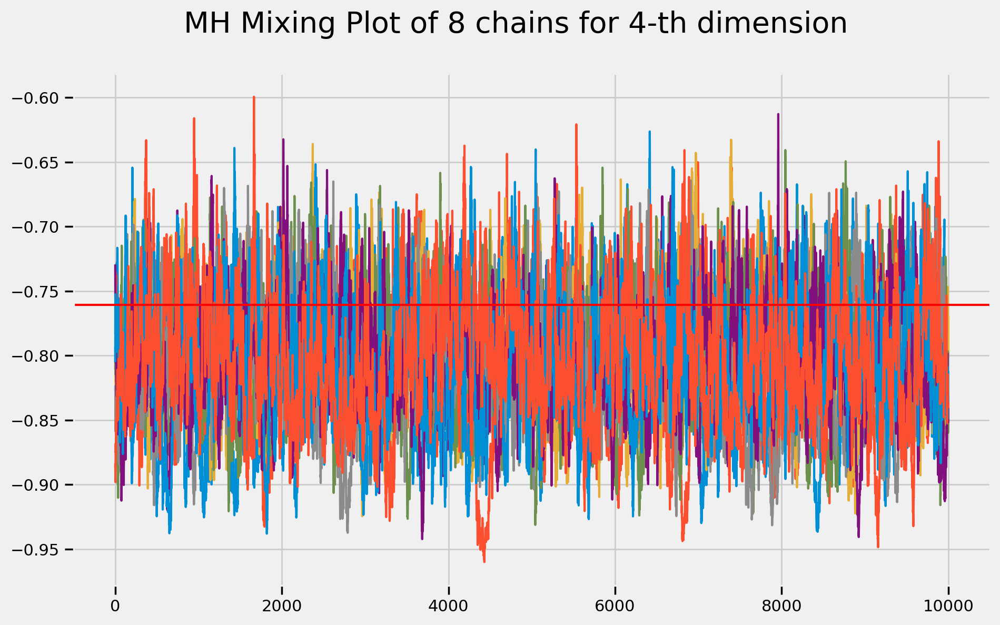

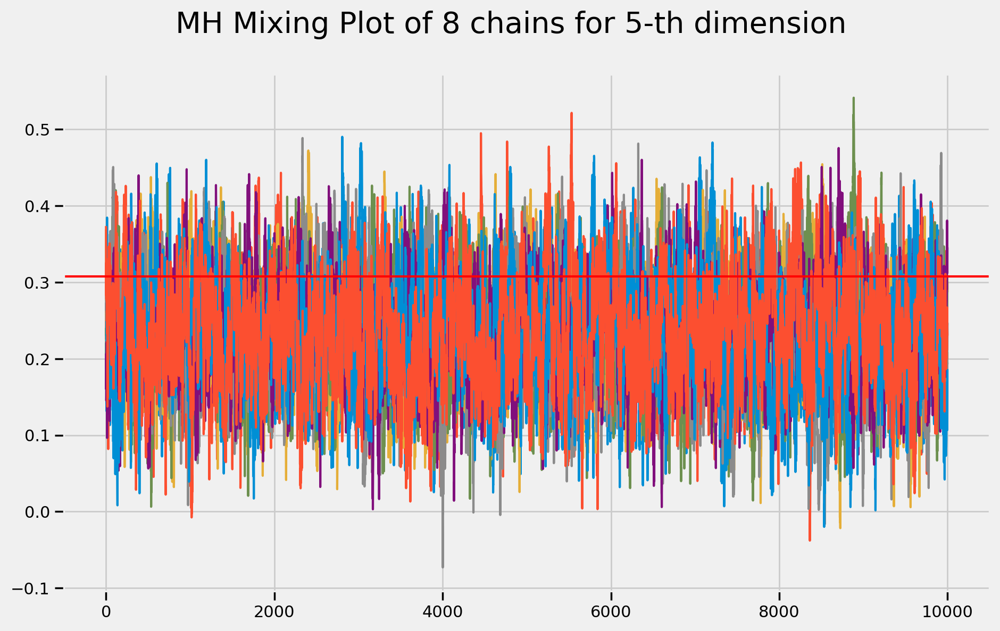

...

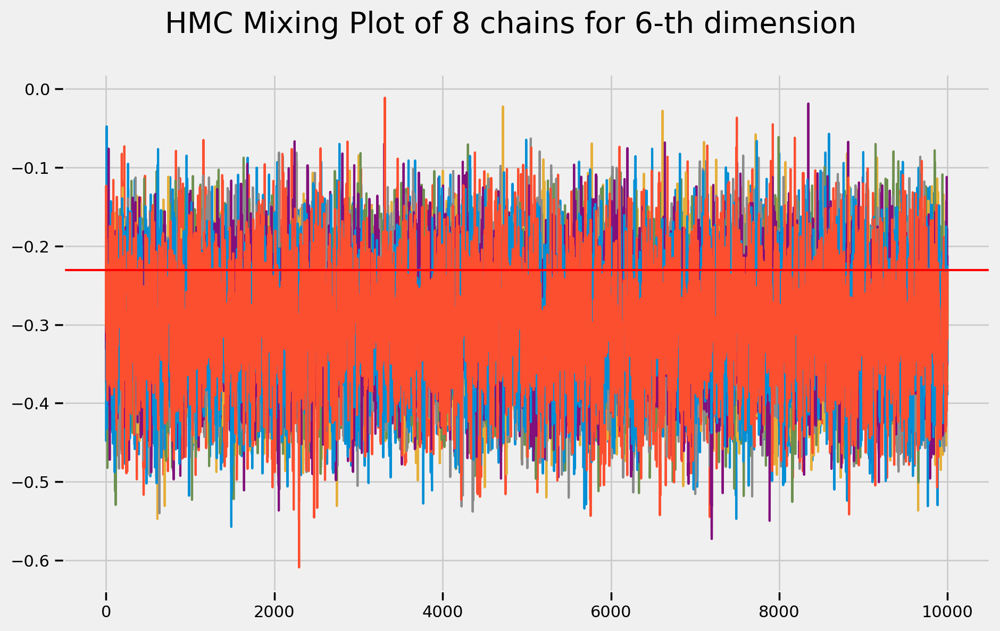

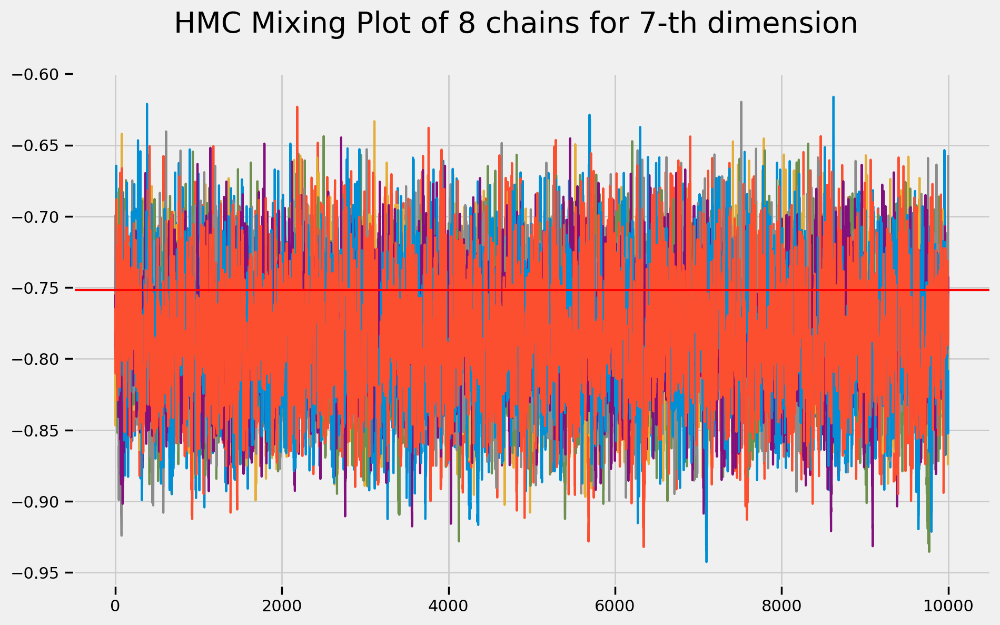

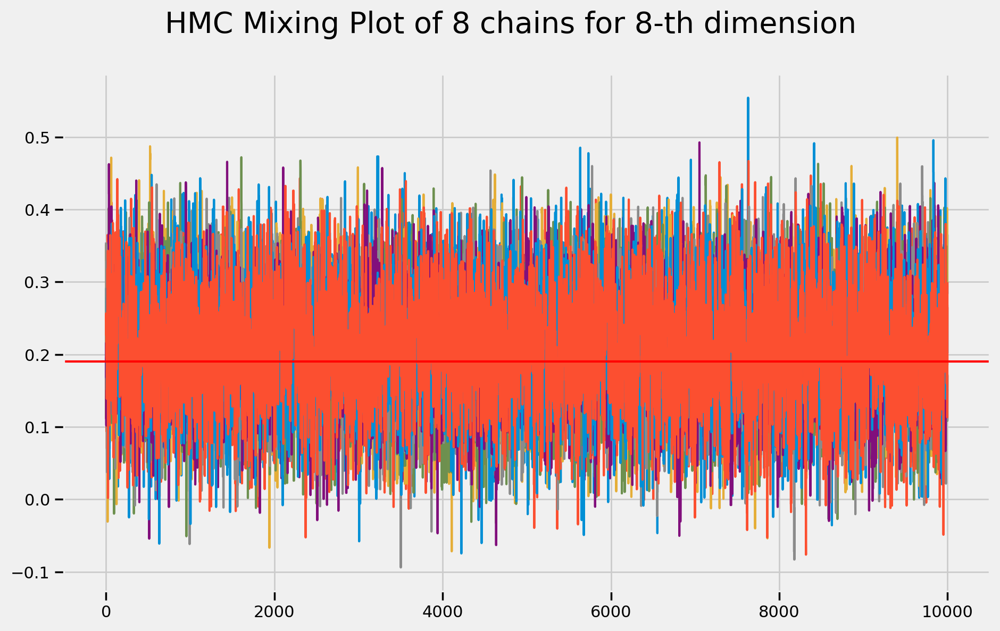

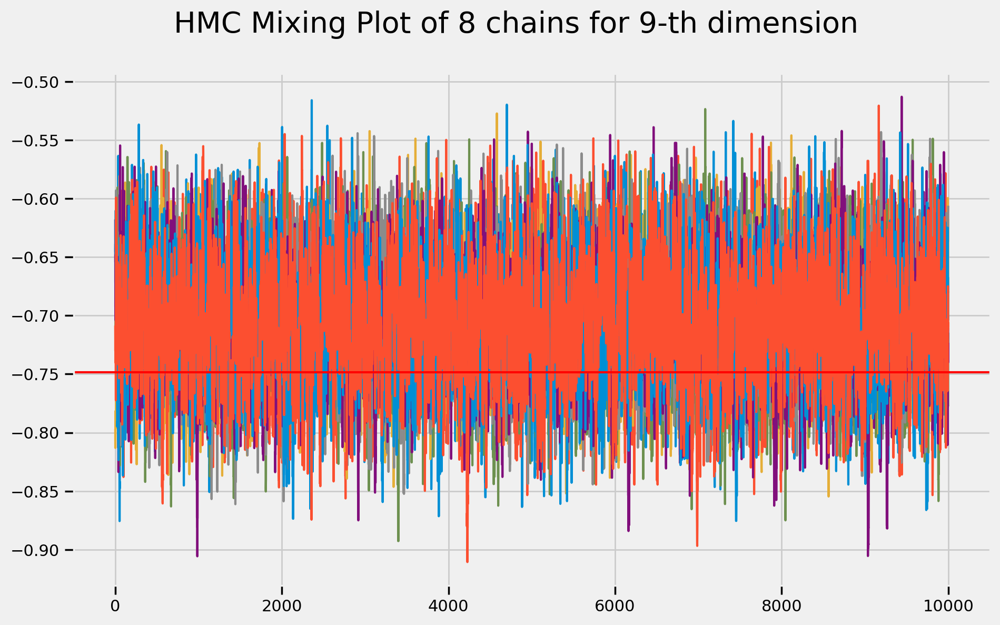

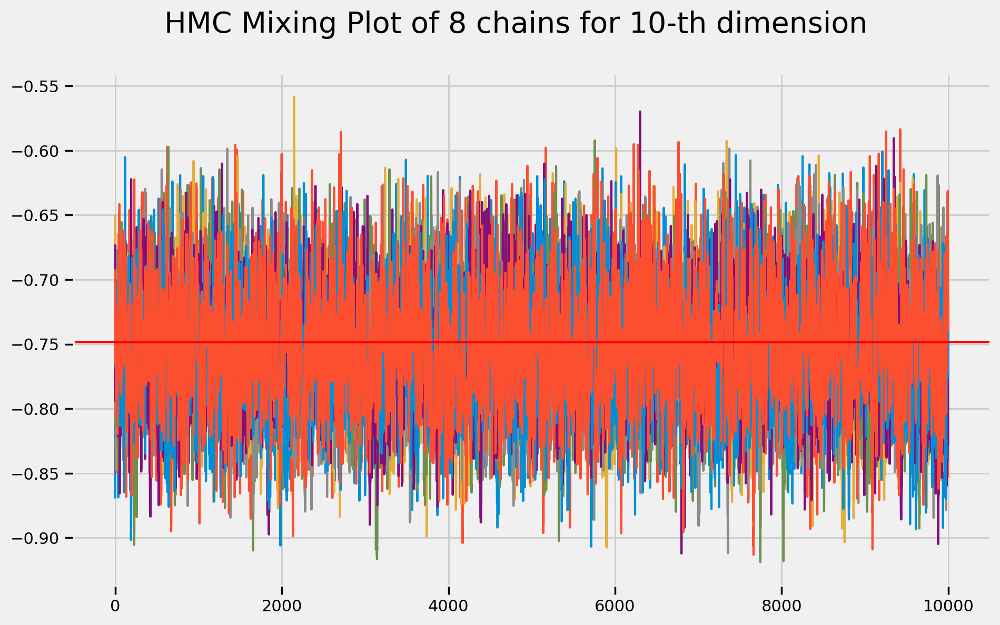

In [ ]:
plot_mixing(state=2)